# Test reading and plotting coefficients with pyEXP

We begin by importing `pyEXP` and friends and setting the working directory.

In [1]:
import os
import yaml
import pyEXP
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12, 9]

# In this test, I assume that you have some directory with a simulation that has 
# a cylindrical component.  Here, I am testing a CBrockDisk simulation from Mike P.
#
os.chdir('/data/Nbody/CubeTest')

## Reading the cube coefficients
This is a test of the coefficients created by the `EXP-examples/Cube` run.

In [22]:
# Reread the coefs from the file.  These are new HDF5 coefficients sets.
#
coefs = pyEXP.coefs.Coefs.factory('outcoef.cube.run6b')

print("Got coefs for name=", coefs.getName())

Got coefs for name= cube


## Now get the time vector and data tensor. Plot some coefficient series as a function of time.

In [1]:

times = coefs.Times()
data  = coefs.getAllCoefs()
nx, ny, nz, ntimes = data.shape
nmaxx = int((nx - 1)/2)
nmaxy = int((ny - 1)/2)
nmaxz = int((nz - 1)/2)

print("The data sizes and coefficient orders are:")
print(data.shape[0], data.shape[1], data.shape[2], nmaxx, nmaxy, nmaxz)

NameError: name 'coefs' is not defined

### Finally, plot some coefficient values...

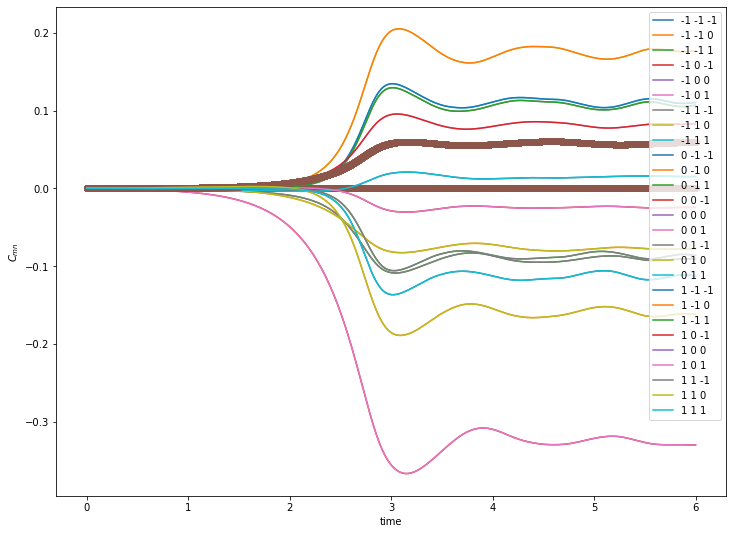

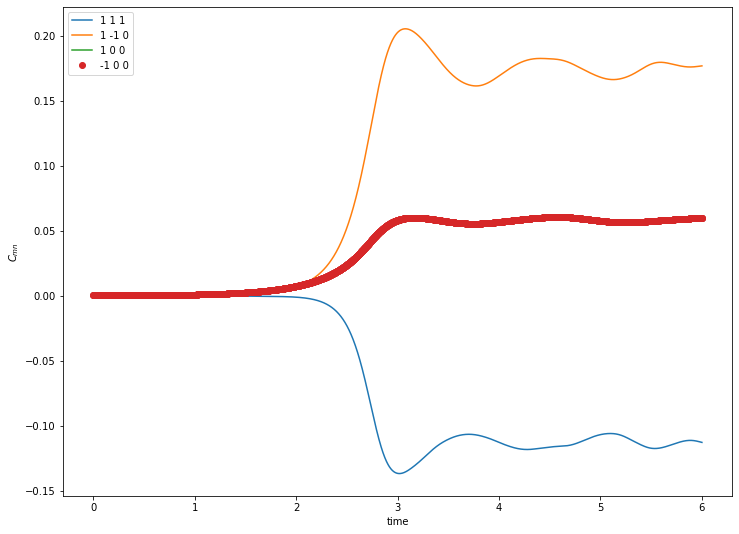

In [24]:
for i in range(nmaxx-1, nmaxx+2):
    for j in range(nmaxy-1, nmaxy+2):
        for k in range(nmaxz-1, nmaxz+2):
            plt.plot(times, np.real(data[i, j, k, :]), label='{} {} {}'.format(i-nmaxx, j-nmaxy, k-nmaxz))
            if j==nmaxy and k==nmaxz:
                plt.plot(times, np.real(data[i, j, k, :]), 'o')

plt.xlabel('time')
plt.ylabel(r'$C_{mn}$')
plt.legend()
plt.show()

plt.plot(times, np.real(data[nmaxx+1, nmaxy+1, nmaxz+1, :]), '-', label='{} {} {}'.format(1, 1, 1))
plt.plot(times, np.real(data[nmaxx+1, nmaxy-1, nmaxz, :]), '-', label='{} {} {}'.format(1, -1, 0))
plt.plot(times, np.real(data[nmaxx+1, nmaxy, nmaxz, :]), '-', label='{} {} {}'.format(1, 0, 0))
plt.plot(times, np.real(data[nmaxx-1, nmaxy, nmaxz, :]), 'o', label='{} {} {}'.format(-1, 0, 0))
plt.xlabel('time')
plt.ylabel(r'$C_{mn}$')
plt.legend()
plt.show()

## Try loading EXP config with pyYAML

In [17]:
with open('config1gpu2.yml', 'r') as f:
    yaml_db = yaml.load(f, Loader=yaml.FullLoader)

In [18]:
# There is only one component here at index = 0

config = yaml.dump(yaml_db['Components'][0]['force'])
        
print(config)

id: cube
parameters:
  nmaxx: 16
  nmaxy: 16
  nmaxz: 16
  planes: true



## Construct the cube basis

In [19]:
basis = pyEXP.basis.Basis.factory(config)

In [20]:
times = coefs.Times()

[0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2, 0.21, 0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3, 0.31, 0.32, 0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4, 0.41, 0.42, 0.43, 0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5, 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6, 0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7, 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8, 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9, 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.0, 1.01, 1.02, 1.03, 1.04, 1.05, 1.06, 1.07, 1.08, 1.09, 1.1, 1.11, 1.12, 1.13, 1.14, 1.15, 1.16, 1.17, 1.18, 1.19, 1.2, 1.21, 1.22, 1.23, 1.24, 1.25, 1.26, 1.27, 1.28, 1.29, 1.3, 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37, 1.38, 1.39, 1.4, 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48, 1.49, 1.5, 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59, 1.6, 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.

In [21]:
# Slice through the cube perpendicular to the z axis
rmin  = 0.0
rmax  = 1.0
pmin  = [ rmin, rmin, 0.5]
pmax  = [ rmax, rmax, 0.5]
grid  = [   40,    40,  0]

fields = pyEXP.field.FieldGenerator(times, pmin, pmax, grid)

surfaces = fields.slices(basis, coefs)

for v in surfaces:
    for k in surfaces[v]: print(v, k)

0.0 dens
0.0 dens m=0
0.0 dens m>0
0.0 potl
0.0 potl m=0
0.0 potl m>0
0.0 x force
0.0 y force
0.0 z force
0.01 dens
0.01 dens m=0
0.01 dens m>0
0.01 potl
0.01 potl m=0
0.01 potl m>0
0.01 x force
0.01 y force
0.01 z force
0.02 dens
0.02 dens m=0
0.02 dens m>0
0.02 potl
0.02 potl m=0
0.02 potl m>0
0.02 x force
0.02 y force
0.02 z force
0.03 dens
0.03 dens m=0
0.03 dens m>0
0.03 potl
0.03 potl m=0
0.03 potl m>0
0.03 x force
0.03 y force
0.03 z force
0.04 dens
0.04 dens m=0
0.04 dens m>0
0.04 potl
0.04 potl m=0
0.04 potl m>0
0.04 x force
0.04 y force
0.04 z force
0.05 dens
0.05 dens m=0
0.05 dens m>0
0.05 potl
0.05 potl m=0
0.05 potl m>0
0.05 x force
0.05 y force
0.05 z force
0.06 dens
0.06 dens m=0
0.06 dens m>0
0.06 potl
0.06 potl m=0
0.06 potl m>0
0.06 x force
0.06 y force
0.06 z force
0.07 dens
0.07 dens m=0
0.07 dens m>0
0.07 potl
0.07 potl m=0
0.07 potl m>0
0.07 x force
0.07 y force
0.07 z force
0.08 dens
0.08 dens m=0
0.08 dens m>0
0.08 potl
0.08 potl m=0
0.08 potl m>0
0.08 x force


2.06 dens
2.06 dens m=0
2.06 dens m>0
2.06 potl
2.06 potl m=0
2.06 potl m>0
2.06 x force
2.06 y force
2.06 z force
2.07 dens
2.07 dens m=0
2.07 dens m>0
2.07 potl
2.07 potl m=0
2.07 potl m>0
2.07 x force
2.07 y force
2.07 z force
2.08 dens
2.08 dens m=0
2.08 dens m>0
2.08 potl
2.08 potl m=0
2.08 potl m>0
2.08 x force
2.08 y force
2.08 z force
2.09 dens
2.09 dens m=0
2.09 dens m>0
2.09 potl
2.09 potl m=0
2.09 potl m>0
2.09 x force
2.09 y force
2.09 z force
2.1 dens
2.1 dens m=0
2.1 dens m>0
2.1 potl
2.1 potl m=0
2.1 potl m>0
2.1 x force
2.1 y force
2.1 z force
2.11 dens
2.11 dens m=0
2.11 dens m>0
2.11 potl
2.11 potl m=0
2.11 potl m>0
2.11 x force
2.11 y force
2.11 z force
2.12 dens
2.12 dens m=0
2.12 dens m>0
2.12 potl
2.12 potl m=0
2.12 potl m>0
2.12 x force
2.12 y force
2.12 z force
2.13 dens
2.13 dens m=0
2.13 dens m>0
2.13 potl
2.13 potl m=0
2.13 potl m>0
2.13 x force
2.13 y force
2.13 z force
2.14 dens
2.14 dens m=0
2.14 dens m>0
2.14 potl
2.14 potl m=0
2.14 potl m>0
2.14 x force


3.58 dens m>0
3.58 potl
3.58 potl m=0
3.58 potl m>0
3.58 x force
3.58 y force
3.58 z force
3.59 dens
3.59 dens m=0
3.59 dens m>0
3.59 potl
3.59 potl m=0
3.59 potl m>0
3.59 x force
3.59 y force
3.59 z force
3.6 dens
3.6 dens m=0
3.6 dens m>0
3.6 potl
3.6 potl m=0
3.6 potl m>0
3.6 x force
3.6 y force
3.6 z force
3.61 dens
3.61 dens m=0
3.61 dens m>0
3.61 potl
3.61 potl m=0
3.61 potl m>0
3.61 x force
3.61 y force
3.61 z force
3.62 dens
3.62 dens m=0
3.62 dens m>0
3.62 potl
3.62 potl m=0
3.62 potl m>0
3.62 x force
3.62 y force
3.62 z force
3.63 dens
3.63 dens m=0
3.63 dens m>0
3.63 potl
3.63 potl m=0
3.63 potl m>0
3.63 x force
3.63 y force
3.63 z force
3.64 dens
3.64 dens m=0
3.64 dens m>0
3.64 potl
3.64 potl m=0
3.64 potl m>0
3.64 x force
3.64 y force
3.64 z force
3.65 dens
3.65 dens m=0
3.65 dens m>0
3.65 potl
3.65 potl m=0
3.65 potl m>0
3.65 x force
3.65 y force
3.65 z force
3.66 dens
3.66 dens m=0
3.66 dens m>0
3.66 potl
3.66 potl m=0
3.66 potl m>0
3.66 x force
3.66 y force
3.66 z forc

## Slice through the cube perpendicular to the z axis and render

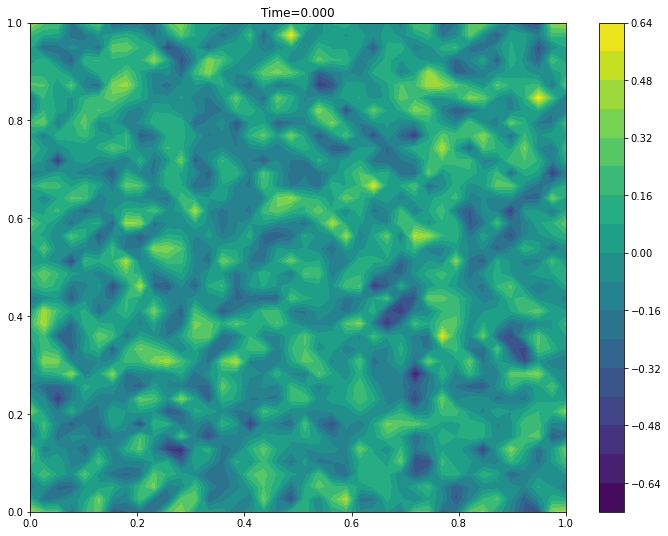

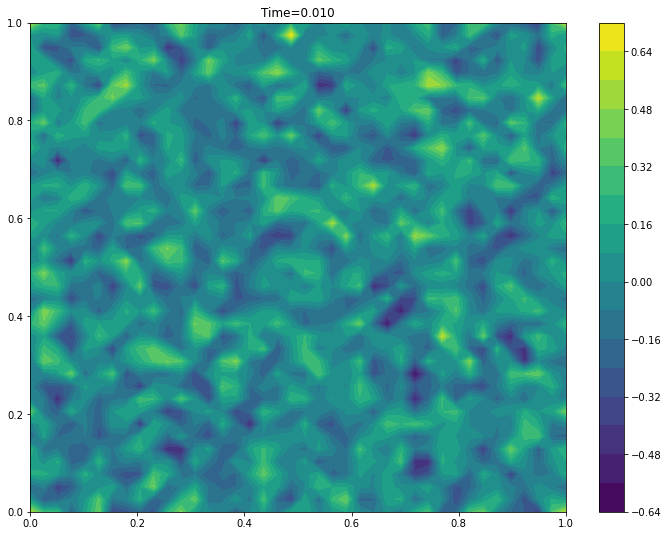

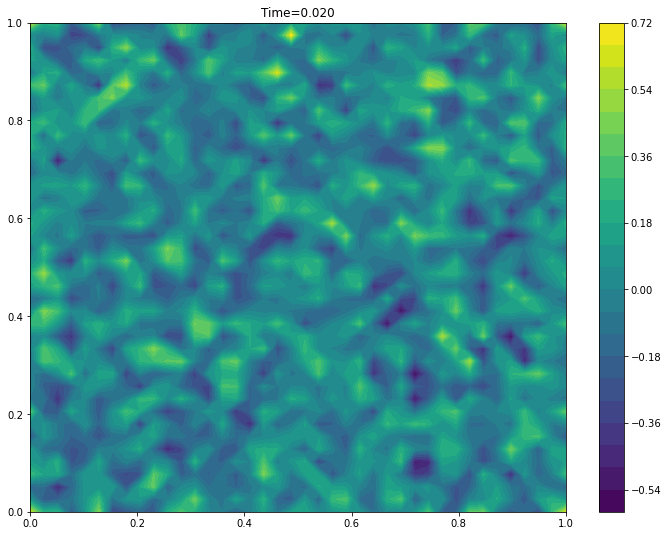

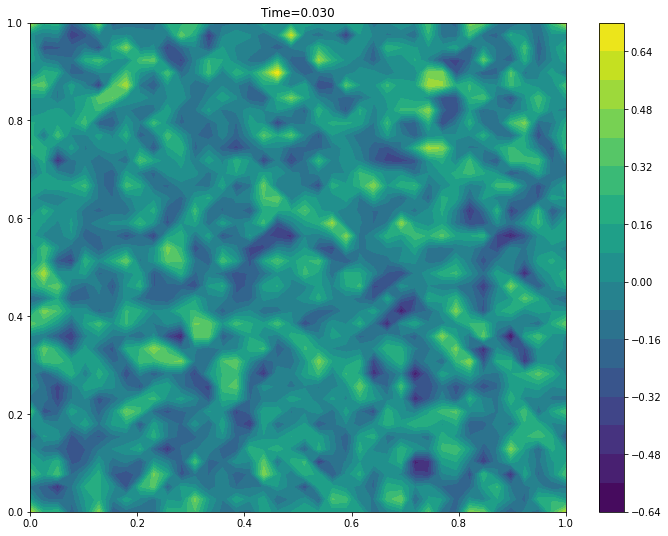

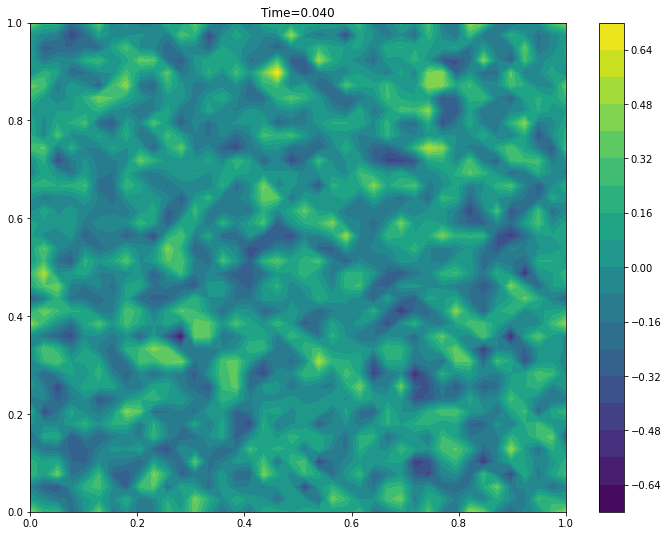

...

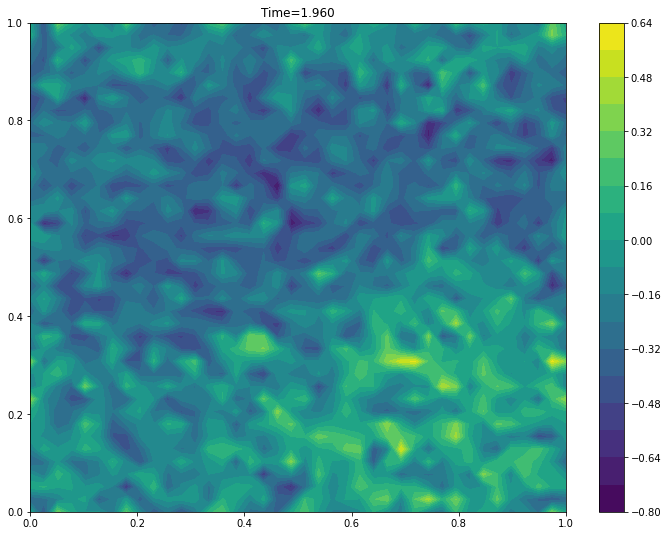

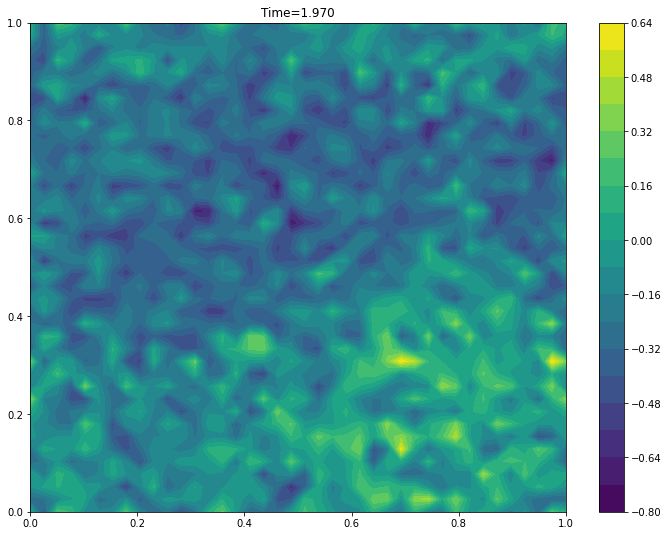

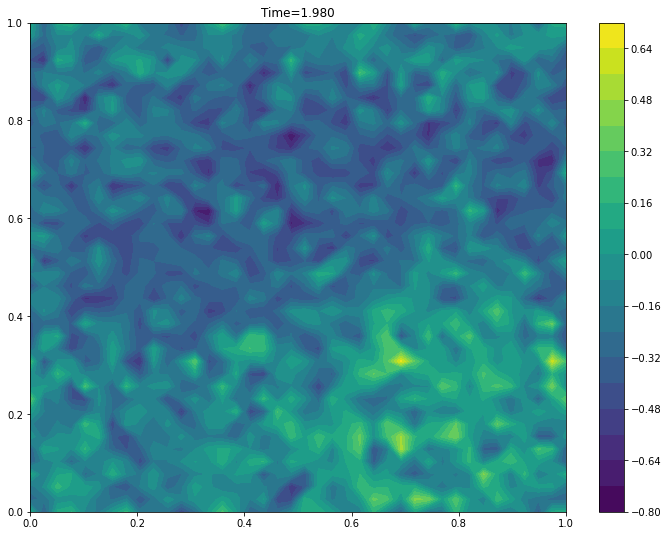

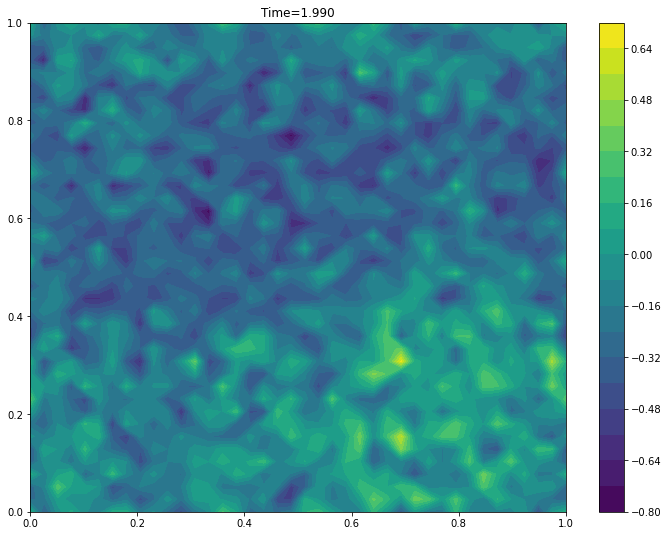

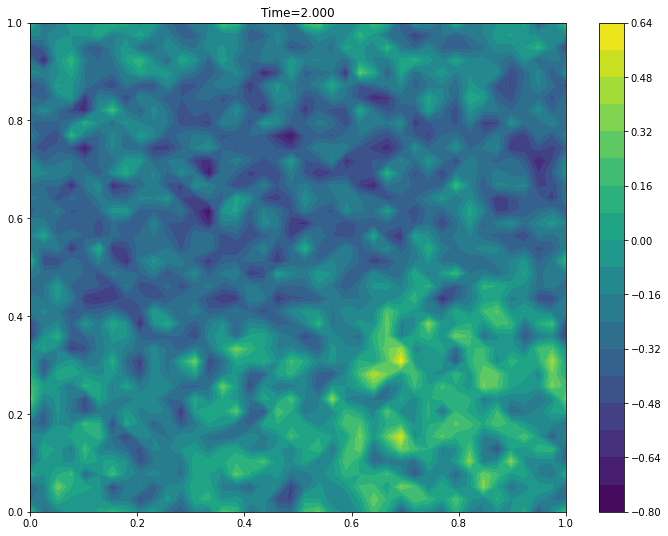

In [13]:
dr = (rmax-rmin)/(40-1)
rr = np.arange(rmin, rmax+0.1*dr, dr)
xv, yv = np.meshgrid(rr, rr)
cnt = 0
levs = np.arange(-0.8, 0.8001, 0.004)
for v in times:
    cc = plt.contourf(xv, yv, surfaces[v]['dens'].transpose(), 20)
    plt.colorbar(cc)
    plt.title('Time={:4.3f}'.format(v))
    plt.savefig('cube_{:04d}.png'.format(cnt))
    cnt += 1
    plt.show()